# HotGym

In [1]:
import csv
import datetime
import os
import numpy as np
import random
import math

from htm.bindings.sdr import SDR, Metrics
from htm.encoders.rdse import RDSE, RDSE_Parameters
from htm.encoders.date import DateEncoder
from htm.bindings.algorithms import SpatialPooler
from htm.bindings.algorithms import TemporalMemory
from htm.algorithms.anomaly_likelihood import AnomalyLikelihood 
#FIXME 代わりにTM.anomalyを使用しますが、 py.AnomalyLikelihoodよりも悪い結果になります
from htm.bindings.algorithms import Predictor

import matplotlib.pyplot as plt
from IPython.display import display, clear_output
%matplotlib inline

_INPUT_FILE_PATH ="gymdata.csv"

In [2]:
# 入力ファイルの読み込み.
records = []
with open(_INPUT_FILE_PATH, "r") as fin:
    reader = csv.reader(fin)
    headers = next(reader)
    next(reader)
    next(reader)
    for record in reader:
      records.append(record)

print(records)

[['7/2/10 0:00', '21.2'], ['7/2/10 1:00', '16.4'], ['7/2/10 2:00', '4.7'], ['7/2/10 3:00', '4.7'], ['7/2/10 4:00', '4.6'], ['7/2/10 5:00', '23.5'], ['7/2/10 6:00', '47.5'], ['7/2/10 7:00', '45.4'], ['7/2/10 8:00', '46.1'], ['7/2/10 9:00', '41.5'], ['7/2/10 10:00', '43.4'], ['7/2/10 11:00', '43.8'], ['7/2/10 12:00', '37.8'], ['7/2/10 13:00', '36.6'], ['7/2/10 14:00', '35.7'], ['7/2/10 15:00', '38.9'], ['7/2/10 16:00', '36.2'], ['7/2/10 17:00', '36.6'], ['7/2/10 18:00', '37.2'], ['7/2/10 19:00', '38.2'], ['7/2/10 20:00', '14.1'], ['7/2/10 21:00', '5.1'], ['7/2/10 22:00', '5'], ['7/2/10 23:00', '5.9'], ['7/3/10 0:00', '22.5'], ['7/3/10 1:00', '22.3'], ['7/3/10 2:00', '6'], ['7/3/10 3:00', '4.7'], ['7/3/10 4:00', '4.4'], ['7/3/10 5:00', '4.8'], ['7/3/10 6:00', '23.4'], ['7/3/10 7:00', '42.4'], ['7/3/10 8:00', '52'], ['7/3/10 9:00', '50.8'], ['7/3/10 10:00', '45.3'], ['7/3/10 11:00', '43.6'], ['7/3/10 12:00', '40.7'], ['7/3/10 13:00', '38.4'], ['7/3/10 14:00', '39.9'], ['7/3/10 15:00', '42.

In [3]:
 # エンコーダーを作成します。 これらは入力データをバイナリ表現に変換します.
dateEncoder = DateEncoder(timeOfDay= (30, 1), weekend  = 21) 

scalarEncoderParams            = RDSE_Parameters()
scalarEncoderParams.size       = 700
scalarEncoderParams.sparsity   = 0.02
scalarEncoderParams.resolution = 0.88
scalarEncoder = RDSE( scalarEncoderParams )
encodingWidth = (dateEncoder.size + scalarEncoder.size)
enc_info = Metrics( [encodingWidth], 999999999 )

print("-"*100)
print("Encoded Input", enc_info)
print("-"*100)

----------------------------------------------------------------------------------------------------
Encoded Input SDR( 1462 )
    Sparsity Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
    Activation Frequency Min/Mean/Std/Max 1234.57 / 1234.59 / 0.0222168 / 1234.57
    Entropy 0
    Overlap Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
----------------------------------------------------------------------------------------------------


In [4]:
# HTMを作る。 SpatialPoolerとTemporalMemoryと関連ツール.
sp = SpatialPooler(
    inputDimensions            = (encodingWidth,),
    columnDimensions           = (1638,),
    potentialPct               = 0.85,
    potentialRadius            = encodingWidth,
    globalInhibition           = True,
    localAreaDensity           = 0.04395604395604396,
    synPermInactiveDec         = 0.006,
    synPermActiveInc           = 0.04,
    synPermConnected           = 0.13999999999999999,
    boostStrength              = 3.0,
    wrapAround                 = True
)
sp_info = Metrics( sp.getColumnDimensions(), 999999999 )

print("-"*100)
print("Spatial Pooler Mini-Columns", sp_info)
print("-"*100)
print(sp)
print("-"*100)

----------------------------------------------------------------------------------------------------
Spatial Pooler Mini-Columns SDR( 1638 )
    Sparsity Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
    Activation Frequency Min/Mean/Std/Max 1234.57 / 1234.59 / 0.0260008 / 1234.57
    Entropy 0
    Overlap Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
----------------------------------------------------------------------------------------------------
Spatial Pooler Connections:
    Inputs (1462) ~> Outputs (1638) via Segments (1638)
    Segments on Cell Min/Mean/Max 1 / 1 / 1
    Potential Synapses on Segment Min/Mean/Max 1243 / 1243 / 1243
    Connected Synapses on Segment Min/Mean/Max 566 / 621.681 / 676
    Synapses Dead (1.47345e-06%) Saturated (4.91151e-07%)
    Synapses pruned (0%) Segments pruned (0%)

----------------------------------------------------------------------------------------------------


In [5]:
tm = TemporalMemory(
    columnDimensions          = (1638,), #sp.columnDimensions
    cellsPerColumn            = 13,
    activationThreshold       = 17,
    initialPermanence         = 0.21,
    connectedPermanence       = 0.13999999999999999, #sp.synPermConnected
    minThreshold              = 10,
    maxNewSynapseCount        = 32,
    permanenceIncrement       = 0.1,
    permanenceDecrement       = 0.1,
    predictedSegmentDecrement = 0.0,
    maxSegmentsPerCell        = 128,
    maxSynapsesPerSegment     = 64
)
tm_info = Metrics( [tm.numberOfCells()], 999999999 )

print("-"*100)
print("Temporal Memory Cells", tm_info)
print("-"*100)
print(tm)
print("-"*100)

----------------------------------------------------------------------------------------------------
Temporal Memory Cells SDR( 21294 )
    Sparsity Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
    Activation Frequency Min/Mean/Std/Max 1234.57 / 1234.49 / 0.08094 / 1234.57
    Entropy 0
    Overlap Min/Mean/Std/Max inf / 1234.57 / 35.1364 / -inf
----------------------------------------------------------------------------------------------------
Temporal Memory Connections:
    Inputs (0) ~> Outputs (21294) via Segments (0)
    Segments on Cell Min/Mean/Max 0 / 0 / 0
    Potential Synapses on Segment Min/Mean/Max 4294967295 / nan / 0
    Connected Synapses on Segment Min/Mean/Max 65535 / nan / 0
    Synapses Dead (nan%) Saturated (nan%)
    Synapses pruned (nan%) Segments pruned (nan%)

----------------------------------------------------------------------------------------------------


In [6]:
# セットアップ尤度（ゆうど）は、これらの設定が NAB
# これらの設定は、NABからコピーされます
probationaryPeriod = int(math.floor(float(0.1)*len(records)))
learningPeriod     = int(math.floor(probationaryPeriod / 2.0))
anomaly_history = AnomalyLikelihood(learningPeriod= learningPeriod,
                                  estimationSamples= probationaryPeriod - learningPeriod,
                                  reestimationPeriod= 100)

predictor = Predictor( steps=[1, 5], alpha=0.1)
predictor_resolution = 1

In [7]:
# データセット内のすべてのデータを反復処理し、入力と出力を記録します.
inputs      = []
anomaly     = []
anomalyProb = []
predictions = {1: [], 5: []}

In [8]:
for count, record in enumerate(records):

    # 日付文字列をPythonの日付オブジェクトに変換する.
    dateString = datetime.datetime.strptime(record[0], "%m/%d/%y %H:%M")
    # データ値の文字列をfloatに変換.
    consumption = float(record[1])
    print(consumption)
    inputs.append( consumption )

    # エンコーダを呼び出して、各値のビット表現を作成します。 これらは SDR オブジェクトです.
    dateBits        = dateEncoder.encode(dateString)
    consumptionBits = scalarEncoder.encode(consumption)

    # これらのすべてのエンコーディングを 1 つの大きなエンコーディングに連結して、
    # 空間プーリング用に使用します.
    encoding = SDR( encodingWidth ).concatenate([consumptionBits, dateBits])
    enc_info.addData( encoding )

    # これは、以下の計算方法で作成されます
    # Spatial Poolerと同じ寸法でなければなりません
    activeColumns = SDR( sp.getColumnDimensions() )

    # 入力空間に対する空間プーリングアルゴリズムの実行.
    sp.compute(encoding, True, activeColumns)
    sp_info.addData( activeColumns )

    # アクティブなミニカラムに対してTemporal Memoryアルゴリズムを実行する.
    tm.compute(activeColumns, learn=True)
    tm_info.addData( tm.getActiveCells().flatten() )

    # 何が起こるかを予測し、今起こったことに基づいて予測器を訓練する.
    pdf = predictor.infer( tm.getActiveCells() )
    for n in (1,5):
        if pdf[n]:
            predictions[n].append( np.argmax( pdf[n] ) * predictor_resolution )
        else:
            predictions[n].append(float('nan'))
        print(pdf)
        
    anomalyLikelihood = anomaly_history.anomalyProbability( consumption, tm.anomaly )
    
    anomaly.append( tm.anomaly )
    anomalyProb.append( anomalyLikelihood )

    predictor.learn(count, tm.getActiveCells(), int(consumption / predictor_resolution))

21.2
{5: [], 1: []}
{5: [], 1: []}
16.4
{5: [], 1: []}
{5: [], 1: []}
4.7
{5: [], 1: [0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705]}
{5: [], 1: [0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705]}
4.7
{5: [], 1: [0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.058823529411764705, 0.05

{5: [1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 0.017379572045690746, 0.9575867093675854, 1.373397770079964e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.5153790951518246e-05, 1.3712609744107666e-05, 5.348007274561915e-05, 1.3712609744107666e-05, 2.03726982664392e-06, 1.1230653362277229e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 1.3712609744107666e-05, 6.649841412844897e-05, 0.023669641109181443, 2.016316985943899e-05, 2.016316985943899e-05, 2.197735153347151e-05, 2.016316985943899e-05, 8.010768602186548e-05, 2.016316985943899e-05, 2.016316985943899e-05, 2.016316985943899e-05, 2.016316985943899e-05, 2.016316985943899e-05, 2.016316985943899e-05, 1.6419829232007658e-05, 8.248566280706147e-07, 4.041430790177274e-06, 3.5024902620260736e-05, 7.688264165014028e-06, 0.0002677001768782743, 1.434891044779931e-05, 7.61064448688490

{5: [0.00010401239211928166, 0.00010401239211928166, 0.00010401239211928166, 0.00010401239211928166, 6.608003921588427e-05, 6.201188063868669e-05, 0.00041989679275011843, 0.00013324746910961348, 0.00010401239211928166, 0.0003314631704921642, 0.0067670590494226385, 8.013287302767424e-05, 0.00014169161259036022, 9.058031414757108e-05, 0.00013683283379126157, 0.00010401239211928166, 0.00010401239211928166, 0.00014027478095537672, 0.00010401239211928166, 0.00010401239211928166, 0.00010401239211928166, 0.00010401239211928166, 0.9731129178105155, 9.625858260417124e-05, 0.00010464274261086324, 0.00010464274261086324, 9.4173070814738e-05, 0.00010464274261086324, 0.00017950284174984583, 0.00011304929425336933, 0.00010464274261086324, 0.00010464274261086324, 0.00010464274261086324, 0.00011001447084835959, 0.00010464274261086324, 0.00010195380699288772, 1.6492534460123607e-06, 0.004731747742786479, 0.0018065769783943907, 4.0973099242561376e-05, 0.0006011954558515667, 0.007518311389315278, 0.00014

{5: [0.0011414293395245587, 0.0011414293395245587, 0.0011414293395245587, 0.0011414293395245587, 0.01938353041922467, 5.812380588228124e-05, 0.0029478349777118397, 0.3787716496693845, 0.0011414293395245587, 0.001148170936306728, 0.0011410369658409743, 0.004755397046197525, 0.0012771258901023738, 0.0018828667355458878, 0.12513035173487413, 0.0011391445227030015, 0.0011414293395245587, 0.0022397726518432644, 0.0011414293395245587, 0.004871651495946047, 0.0012403792607118401, 0.0011414293395245587, 0.0005786249569826793, 7.850051261184444e-05, 0.00114133522800001, 0.0013926521834161506, 0.0011214917111439801, 0.00114133522800001, 0.00578079041671826, 0.0011202242843407575, 0.00114133522800001, 0.0011413465414606592, 0.00114133522800001, 0.001141092915132622, 0.00114133522800001, 9.812695723933758e-05, 4.179472795661024e-05, 9.329694561802138e-05, 0.0006065975957744975, 0.16996434969861002, 0.0030414102141451626, 0.0007478897616062612, 0.20220969448564016, 4.598625425414204e-06, 0.00116662

{5: [0.00028781489625303734, 0.00028781489625303734, 0.00028781489625303734, 0.00028781489625303734, 0.005366229569977147, 4.7758742345391354e-05, 0.971145366034372, 0.000341232699339567, 0.00028781489625303734, 0.00028542954314208835, 0.0002858754263478725, 0.000286810524335845, 0.0011577424970343321, 4.279943731572404e-05, 0.00034831813632040664, 0.0002877278756652028, 0.00028781489625303734, 0.00042833028431634476, 0.00028781489625303734, 0.000317888565133978, 0.00028766690116129387, 0.00028780471181771513, 0.0019189301450194764, 0.0004938258863091333, 0.0002950430976847232, 0.00044007331565299287, 0.0002949432213818469, 0.0002950430976847232, 8.875732184180514e-05, 0.0002945128384178683, 0.00032597339686962404, 0.0003248216530872612, 0.0002950430976847232, 0.0002942890716697816, 0.0002950430976847232, 0.00013486585428237974, 0.0002399556629521136, 0.0011324625561740203, 0.004648957568153883, 0.0012686849825583972, 0.00035078052041041677, 0.00036077004321138494, 4.2523686935680886e-

{5: [6.911465491566489e-06, 6.911465491566489e-06, 6.911465491566489e-06, 6.911465491566489e-06, 8.55314684780123e-10, 0.9948155461275509, 1.851102676468133e-05, 2.0869429446074435e-05, 6.911463268686485e-06, 6.689283388728481e-06, 6.806317549588845e-06, 7.903516566446145e-06, 2.938490400963461e-05, 2.9224600811514634e-06, 7.241769616823202e-06, 6.85133903700122e-06, 6.911514923661012e-06, 1.1423733441915094e-05, 7.64963742913362e-06, 7.438310211014094e-06, 6.519278762388236e-06, 6.899245737071597e-06, 1.0507149313732427e-07, 6.0926101250695544e-05, 7.379455682621026e-06, 0.0025362349408318183, 7.374627147442658e-06, 7.379455682621026e-06, 8.018936571512248e-06, 7.3711453506734115e-06, 7.383089019775579e-06, 0.0009603337502243273, 7.379455682621026e-06, 7.378764058939943e-06, 7.379455682621026e-06, 7.437977415347159e-06, 6.931151375688277e-06, 2.638071125032144e-06, 7.617192209477127e-06, 1.2156086528044795e-05, 6.84012367365834e-06, 5.166784537110048e-06, 4.0813774725277584e-07, 3.157

{5: [3.400995113977921e-05, 3.400995113977921e-05, 3.400995113977921e-05, 3.400995113977921e-05, 2.2367096895453095e-05, 0.007161361592408663, 2.0884091320469563e-05, 4.3020068479751415e-05, 3.4009344497060435e-05, 3.391241186655462e-05, 3.715651815873973e-05, 3.65182504004438e-05, 2.6057494185574462e-05, 3.29367320641589e-05, 3.992791341432383e-05, 3.12946275134534e-05, 3.7557585778291047e-05, 3.3681262098629365e-05, 3.082407327021203e-05, 3.612647487113946e-05, 3.753810773337988e-05, 3.398850776892836e-05, 4.043257718926029e-06, 1.118797936250392e-05, 3.438978539485693e-05, 3.016866875762692e-05, 3.437378543054999e-05, 3.438978539485693e-05, 3.715463511443665e-05, 3.4350762864383386e-05, 3.438737669024681e-05, 3.437962759297457e-05, 3.438978539485693e-05, 3.438534674289297e-05, 3.438978539485693e-05, 3.0445289656147027e-05, 3.940604949564914e-05, 0.9908244353991612, 1.763197880115541e-05, 3.839280193855492e-05, 3.409457439477994e-05, 5.651535835266765e-05, 0.00022379626337631724, 4.4

{5: [0.0002015663335405793, 0.0002015663335405793, 0.0002015663335405793, 0.0002015663335405793, 0.00014268397797346052, 0.010528784063690483, 0.0001256884409617306, 0.00025463040588150727, 0.00020156276298422364, 0.00020099009273731632, 0.00022009611512556764, 0.00021615933730029886, 0.0001544809872702942, 0.00019536925880938035, 0.00023628093901954838, 0.0001855739579404883, 0.00022243433190969743, 0.00019950333495980533, 0.00018279857908737527, 0.00021396927523651945, 0.00022203208013671656, 0.00020130369985696948, 2.0553832402253416e-05, 6.655614916148719e-05, 0.00020372587789783438, 0.00017876908229850526, 0.00020363175221984478, 0.00020372587789783438, 0.00021998677202953818, 0.00020349628848741414, 0.00020371171582493695, 0.00020366529804638999, 0.00020372587789783438, 0.00020369964112251904, 0.00020372587789783438, 0.00018049157380873527, 0.00023231422374318897, 0.0010904347021450658, 9.889296609826522e-05, 0.00020355665854550906, 0.00020113629378074372, 0.00031207156458857395,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{5: [0.0012688227735370996, 0.0012688227735370996, 0.0012688227735370996, 0.0012688227735370996, 0.0013251076206438881, 8.94213657319785e-05, 0.0015398883136730013, 0.0013811118287866534, 0.0015228755715081257, 0.0012085600204690408, 0.002316886092001477, 0.0012877314666107152, 0.0018151086988798838, 0.000561401790025349, 0.0014982403428532307, 0.0013782206513962751, 0.0012703651738749397, 0.0012651671088281518, 0.0011551634651566474, 0.0012479620482741811, 0.0011618881128884681, 0.0013973162005445898, 0.000344000056055688, 0.001132749176826647, 0.0012685424652027603, 0.001269045022434702, 0.0012077290694449388, 0.0012685602693738095, 0.0010192095607197435, 0.0018423616064079191, 0.0012279339697810478, 0.0014921141284977004, 0.8372569505854585, 0.0023265536372717058, 0.015946914898745973, 0.0008398360850844339, 0.022901535573392244, 0.03382667551749551, 0.007379526300809584, 0.010275092379402767, 0.0001451679080512845, 0.0015559825209192643, 0.0016246847091408987, 0.001975059079733048

{5: [6.873733028975979e-05, 6.873733028975979e-05, 6.873733028975979e-05, 6.873733028975979e-05, 6.769879678965329e-05, 0.005710458399348374, 8.699023826730165e-05, 6.616325987597885e-05, 6.850067225940229e-05, 0.000180381979097568, 8.46498121067764e-05, 3.9996430724241946e-05, 9.515441443431799e-05, 8.25715940835845e-05, 0.9878136092667817, 0.00013785230531356674, 6.859129981141935e-05, 9.432227703957296e-05, 6.890649519900022e-05, 9.126061549457239e-05, 0.00012105511069632831, 7.374621890907143e-05, 4.6588996977097736e-05, 3.3239076573462575e-05, 0.00010317989852613754, 9.148104167203322e-05, 0.0002791541839981138, 8.194573585626405e-05, 0.0007646996173571356, 3.4036574962578285e-05, 0.0010935467484615743, 9.217113466731863e-05, 0.0001318170568573758, 0.000289738898914574, 6.659594177926674e-05, 8.076126463709182e-05, 2.3418775819903474e-07, 0.00013725004199238947, 6.532285427597968e-05, 8.344935766012674e-05, 3.592331047669385e-07, 7.615814532392482e-05, 1.1369768264866462e-05, 6.38

{5: [9.297012546949616e-05, 9.297012546949616e-05, 9.297012546949616e-05, 9.297012546949616e-05, 0.0052811582495366, 0.9882557125416324, 2.409216017858862e-05, 0.0007205148878590237, 9.297186938713002e-05, 8.550079965958209e-05, 0.00010070368393047507, 0.00012004916771062492, 0.00025383558389823277, 8.240270160580313e-05, 0.0002128168301326001, 0.00011259554536235115, 8.586892830910875e-05, 0.00010107138938187224, 0.00010144272268782016, 9.517032785189433e-05, 0.0002043767157348056, 9.255374653672596e-05, 7.254190329639935e-07, 6.344488687472234e-05, 9.486983122011478e-05, 9.847082363176066e-05, 9.941184549458323e-05, 9.487736626089831e-05, 7.639889228164215e-05, 0.00010078094126065463, 9.488500975864475e-05, 9.478220617236526e-05, 9.487738116520445e-05, 0.00010351352945079066, 9.486997002745891e-05, 7.224873858708233e-05, 0.0001227883741677399, 8.457919659390471e-05, 9.099783999512051e-05, 0.00010428351782692726, 0.00012060775351951319, 0.0002095214954145272, 7.526075682178247e-05, 0.

{5: [0.0003159686920006572, 0.0003159686920006572, 0.0003159686920006572, 0.0003159686920006572, 0.00046324260957529984, 0.00018740111761452315, 0.0002933768412823484, 0.00028298841219855943, 0.00026817310325370167, 0.0002808502305928388, 0.0003788422672136881, 0.00030341154661759907, 2.5928969402772193e-05, 0.00020387222886151675, 0.00039691432187010853, 0.00036980358123082344, 0.0003189587779492537, 0.00034320405188151585, 0.0003446134826603417, 0.0003156787315811909, 0.0003588720024359407, 0.0002921054702324837, 0.00039911364072822925, 0.00020279714041139093, 0.00031570873650540944, 0.0003157619395276777, 0.0003234411133486229, 0.0003157087259018316, 0.0002524059547399937, 0.000353582745628854, 0.0003107488982049177, 0.0004385601244747161, 0.00031565785265438086, 0.00031225416933661177, 0.0009341565476911558, 0.0010107521105741743, 0.0003961152447921443, 0.9732716601351505, 0.0037322208120908946, 0.001371314372829848, 0.0004869740216738217, 0.0007537554635394987, 0.00063086111840950

47.7
{5: [2.2320178744135852e-05, 2.2320178744135852e-05, 2.2320178744135852e-05, 2.2320178744135852e-05, 3.5638648158863454e-05, 0.9984838143792674, 4.305191195563721e-05, 4.843151097268986e-05, 2.2320563814801063e-05, 5.6629618629032206e-05, 2.074560129724934e-05, 1.927506688750884e-05, 5.280631009904823e-05, 2.4217461877337912e-05, 2.1672136684326253e-05, 2.050351593652375e-05, 2.0657152590194412e-05, 2.95905314999306e-05, 2.2311602334622403e-05, 2.2229618592359607e-05, 4.0385303546474476e-05, 2.231297507198169e-05, 3.643661758630379e-05, 7.075747303210253e-06, 2.2473992245723543e-05, 2.2454357708384962e-05, 2.6890992916249487e-05, 2.2475540020647243e-05, 1.341165687626414e-05, 2.4531926872960713e-05, 2.0431714943063445e-05, 2.361720310017977e-05, 2.247339738621285e-05, 2.815344219980319e-05, 2.245224805290919e-05, 1.8935776986080738e-05, 1.5140552544964021e-05, 5.315003286123654e-07, 6.618014257965879e-06, 2.225533210761221e-05, 3.0466288059712852e-05, 3.596407921179029e-05, 2.4311

{5: [4.9598364078683334e-05, 4.9598364078683334e-05, 4.9598364078683334e-05, 4.9598364078683334e-05, 1.7610124626487416e-05, 1.0797328407774254e-05, 0.0005801072093052969, 6.313959889949995e-05, 4.553625530808306e-05, 7.574813100772577e-05, 5.053368338362439e-05, 5.300636857103953e-05, 5.5565448763360105e-05, 1.5380808911432688e-05, 0.00012174508372885093, 4.921197717130519e-05, 5.6986986911512e-05, 8.074495242080635e-05, 7.973436423328464e-05, 0.00013244012278768028, 5.331221927232535e-05, 4.856092957859174e-05, 3.205800660555942e-07, 1.0661069522909541e-05, 7.518786495106846e-05, 0.00012434349668283124, 5.041983302282037e-05, 5.1053722486059464e-05, 5.0422750052084155e-05, 5.1094086870734316e-05, 4.8114791397648566e-05, 4.9537154628518584e-05, 5.105030185866531e-05, 5.0942536639337386e-05, 5.0932947006782244e-05, 4.864262045710125e-05, 0.00011663206749700919, 0.0007078716854631022, 0.9898532060163798, 0.000621201213434988, 0.0007942661610719935, 0.0031266873613473405, 7.0692754381035

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{5: [0.0022018225554206647, 0.0022018225554206647, 0.0022018225554206647, 0.0022018225554206647, 0.0019328176109360805, 0.0008369576757773796, 0.0008309541923800783, 0.009508658056244975, 0.0004897529233319474, 0.0021988239099999655, 0.0021615610291300593, 0.001975651063947892, 0.0017259832950511922, 0.0001153435178620265, 0.002715763996485922, 0.002444413255429178, 0.0022538591904168554, 0.002144121926102095, 0.002011294396102204, 0.0014265832628549545, 0.0024095926093655917, 0.0023606932538924185, 0.00023579171094250336, 0.0008558830445636545, 0.002454038550066074, 0.0019690035963285404, 0.002220899165070994, 0.0022222714315157242, 0.0021535223912063314, 0.0022200886720788048, 0.002221146081391058, 0.0022606876501772505, 0.0022211473555560366, 0.017052271592354198, 0.0022186390787383454, 0.010871418600199415, 0.004479292702697221, 0.009306505588402807, 0.004814279951023759, 0.003930228278636832, 0.006002554369630265, 0.014729420302794994, 0.00973731831797248, 0.00964478028731044, 0.

{5: [0.0003603335198721772, 0.0003603335198721772, 0.0003603335198721772, 0.0003603335198721772, 0.00034946196778711154, 0.0003195485550740806, 0.00039289884717913384, 0.0003122560252548028, 0.0004231551695159513, 0.00045603797914914714, 0.0005026690676739941, 0.00027249461345084673, 0.00035444569106270587, 0.00019686203646790423, 0.00036403825311074733, 0.0004708922109797752, 0.00031629111901020025, 0.0003548985014046402, 0.00035717914356822014, 0.00024561026070341833, 0.00036696446599263516, 0.00035366870953731786, 0.0001765657107624599, 0.00028863554328784123, 0.000357008417041326, 0.0003525716604555378, 0.0003749404185030964, 0.00036019091205905814, 0.0003122779375299189, 0.00032715785462292545, 0.00038761101301590395, 0.0004353848319437025, 0.0003603432927888511, 0.00044687355156706386, 0.0003609450103506866, 0.00013192925911032229, 0.00010886711936583113, 7.573119088120593e-05, 0.0004686239570300837, 0.0007127316999303849, 0.001048132558869384, 0.003345961413513117, 0.00551765156

{5: [0.000320637628276959, 0.000320637628276959, 0.000320637628276959, 0.000320637628276959, 7.789553908696806e-05, 0.0003612435479152688, 0.00032571235962062134, 0.0002605107081529007, 0.0006250769649062714, 0.0006022665056818594, 0.00034650551688729023, 0.0003063350429048871, 0.00021997111591181748, 0.00031787213419525346, 0.0003523554937038657, 0.0003104442412214511, 0.00034321162229491634, 0.00029289436673524117, 0.00033994136172517983, 0.0003542806559297139, 0.0003092414006535421, 0.000289233684995551, 0.0001576440439585217, 0.0003258660189129305, 0.000320752130134564, 0.00033214979490023966, 0.00032324406158639737, 0.0003273778548739332, 0.0003222317223093385, 0.00029147559521030164, 0.00030977912449794005, 0.0003263091701455773, 0.00032722133693651194, 0.0003234303109505509, 0.0003016444951322522, 0.00023383186355906583, 0.0002273109444441481, 0.00040539368966554265, 0.000295288005341222, 0.0005298724385011482, 0.0004684025198993818, 0.0003598714935922709, 0.0002411162415960523,

{5: [0.0004193991402212882, 0.0004193991402212882, 0.0004193991402212882, 0.0004193991402212882, 0.0005760779322519161, 0.0012548304543166986, 0.00047659907276372394, 0.0004161363766428961, 0.00045443374240939174, 0.000950551093816414, 0.0007899224269305145, 0.0005885670365024404, 0.9558691215119232, 0.0006456969200530287, 0.00021103504204936645, 0.0006476159836509565, 0.00041939059206631585, 0.00041837852939503867, 0.0004189394734954705, 0.0004539453280376713, 0.0004965611706710728, 0.00038903293241472685, 0.0004511110369756786, 0.00010998330120784758, 0.0010715962780321556, 0.0010752627007810953, 0.00044727044643635944, 0.0003888580434146039, 0.0013839759629713615, 0.0005163078164965047, 0.0007684554374986232, 0.0004245553667635471, 0.0005485042916590335, 0.00073286024376357, 0.0005813891025956839, 0.00033844082419272705, 0.0018052667697138363, 0.0006720684112411857, 0.00016994957926035788, 0.00026669384435804483, 0.0007997884014225999, 0.0006034439344577299, 0.0004095721702645109, 0

{5: [4.9076082333073365e-05, 4.9076082333073365e-05, 4.9076082333073365e-05, 4.9076082333073365e-05, 5.1123864153411126e-05, 1.8287587934547645e-05, 5.194442240881935e-05, 5.7744168394556425e-05, 9.857373771745308e-05, 7.376850349757934e-05, 5.982993813682511e-05, 5.046463333722264e-05, 0.0001970241524545508, 3.6488534737897056e-05, 0.0001259453386125466, 5.574265843548633e-05, 5.357744149818585e-05, 0.00015289053501328336, 0.00013873207096349663, 0.00020350809874828383, 0.0011232072584380019, 0.0001877507458202183, 0.9932552813776594, 0.00010987913360270225, 8.272006877308816e-05, 0.000365657224012939, 9.991437739801397e-05, 4.973507538137237e-05, 4.34906912308182e-05, 5.4144917847179013e-05, 4.950546073655644e-05, 4.963107067993643e-05, 4.965494476666669e-05, 5.7433993780395124e-05, 4.7096128761557004e-05, 4.956112196482615e-05, 3.2966481712925083e-07, 5.758289068086862e-05, 4.5872329663770366e-05, 8.129732982287412e-05, 6.2863068961148e-05, 7.821669528349464e-05, 4.30968275828919e-0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{5: [0.0006636112789167918, 0.0006636112789167918, 0.0006636112789167918, 0.0006636112789167918, 0.00023322991948253433, 0.010241631672811979, 0.004381028833928729, 0.0012637317431009993, 0.0021959564627769246, 0.0003888915825684345, 0.0005508601369603427, 0.0009242652364716153, 0.0011215490213219333, 0.0031678253011122653, 0.00194856679242206, 0.0005454003212623802, 0.0012421830739218504, 0.00023432541412526874, 0.002029561303078327, 0.011014031197961578, 0.0006067210518964168, 0.0008064043383322429, 0.0009843979105353332, 1.6038977317461478e-05, 0.0009866923646804425, 0.0022069055770856977, 0.0006729179178987709, 0.0006734008145879867, 0.0007277403044835525, 0.0006331666042206358, 0.0006733962600113125, 0.0002450520537747276, 0.0006733717214395512, 0.0006729108914639966, 0.0006333503462193918, 0.0012871469346418776, 0.0004912119765045869, 0.0002901231558277234, 0.0012216910161627344, 0.0005632849081275261, 2.3732582349423928e-05, 0.0002869137773344397, 0.0003440779059903573, 3.44548

74.1
{5: [0.00010089188849469005, 0.00010089188849469005, 0.00010089188849469005, 0.00010089188849469005, 0.0001166091786051502, 4.885057810505342e-05, 0.000114663844704805, 0.00010569026128875743, 8.242340779421267e-05, 9.127276245413945e-05, 0.00011743311849824564, 0.00010535706342408146, 7.625490352505488e-05, 8.255017067972764e-05, 0.0001292976057470888, 9.867256861112656e-05, 9.923487211311963e-05, 0.0001325651029248258, 0.00011706024400816393, 8.756011144611801e-05, 9.903357996670292e-05, 0.0001002188690236893, 0.0001363438218607917, 0.00011759268578850878, 0.00011862063711602934, 0.00011121368947129093, 9.597186997059348e-05, 0.00010066288914749064, 7.877076385961547e-05, 9.088949749518615e-05, 9.843302157819101e-05, 0.000149720882841409, 0.00020051040498203832, 9.085723572582658e-05, 0.0001434631405692225, 0.0002780572708868153, 0.0005126682181772484, 5.081872821284308e-07, 0.0001566781312080037, 0.00037947012276154477, 0.00025724890158255423, 0.00015379801241691086, 0.00053254

{5: [0.0003122653486734364, 0.0003122653486734364, 0.0003122653486734364, 0.0003122653486734364, 0.00031576460881307564, 0.00022437743219616907, 0.00030135852461515595, 0.00030917880759529637, 0.0003424997318452194, 0.0005220012957354835, 0.0003419426393045953, 0.00022447040638807548, 0.0004728745707883346, 0.00028576431378907294, 0.0003945265754373814, 0.0003107155129639515, 0.0003124701373970374, 0.00031278665226470737, 0.0003079245820185826, 0.00029407660751680465, 0.00041382218458717237, 0.0003127228196393118, 0.0001899975559248681, 6.346634821371278e-05, 0.0003154758093291124, 0.0001681976405644759, 0.0008981138493511678, 0.00029288972629030205, 6.856300565430608e-05, 0.0003102999012621956, 0.00038835329833777454, 0.0002739448344701794, 0.00041704169371747175, 0.000744372492312016, 0.00031565411879272057, 0.00023572345781887425, 0.0001759398548173681, 0.0002850943064714847, 0.0007206252894548231, 0.0009202988265339914, 0.0012754896168157386, 0.00040523327313344486, 0.0011579773269

{5: [6.320505859275825e-05, 6.320505859275825e-05, 6.320505859275825e-05, 6.320505859275825e-05, 0.0010740280161856332, 0.9904594310041158, 4.227144690339652e-06, 0.0007559462845908874, 0.0009257768132565669, 7.399024249971329e-05, 6.796994992300484e-05, 6.844187616923239e-05, 6.0705941629085424e-05, 1.702326964390413e-05, 5.314578405336553e-05, 6.312843517087503e-05, 6.33940567010535e-05, 7.767596349499934e-05, 5.221343323616538e-05, 5.192797140963158e-05, 0.00018441949680258086, 6.939306938513124e-05, 0.00018968403774109174, 6.528105871806566e-05, 0.0001277275586058142, 5.693244600957029e-05, 9.567270275034015e-05, 6.358859090757518e-05, 5.2241818930907865e-05, 6.763792495921669e-05, 6.357605847105134e-05, 6.90080858928772e-05, 6.356236055277893e-05, 8.020023027135104e-05, 6.355797314854446e-05, 5.201890520140391e-05, 6.436755382136238e-05, 7.590696206213501e-05, 7.562720274339267e-05, 8.726552130691688e-05, 6.428942690101524e-05, 5.494035480583786e-05, 7.794708694299193e-05, 3.03773

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [10]:
# HTMの状態に関する情報と統計を印刷する.
print("-"*100)
print(sp)
print("-"*100)
print(tm)
print("-"*100)

----------------------------------------------------------------------------------------------------
Spatial Pooler Connections:
    Inputs (1462) ~> Outputs (1638) via Segments (1638)
    Segments on Cell Min/Mean/Max 1 / 1 / 1
    Potential Synapses on Segment Min/Mean/Max 1243 / 1243 / 1243
    Connected Synapses on Segment Min/Mean/Max 75 / 209.022 / 670
    Synapses Dead (0.734192%) Saturated (0.0345741%)
    Synapses pruned (0%) Segments pruned (0%)

----------------------------------------------------------------------------------------------------
Temporal Memory Connections:
    Inputs (5991) ~> Outputs (21294) via Segments (8050)
    Segments on Cell Min/Mean/Max 0 / 0.378041 / 2
    Potential Synapses on Segment Min/Mean/Max 32 / 35.6798 / 64
    Connected Synapses on Segment Min/Mean/Max 31 / 34.6574 / 64
    Synapses Dead (0%) Saturated (0.537086%)
    Synapses pruned (0.471997%) Segments pruned (0%)

------------------------------------------------------------------------

In [11]:
# 予測した入力と一致するように予測値をシフトする.
for n_steps, pred_list in predictions.items():
    for x in range(n_steps):
        pred_list.insert(0, float('nan'))
        pred_list.pop()

# 予測精度、Root-Mean-Squaredを計算します
accuracy         = {1: 0, 5: 0}
accuracy_samples = {1: 0, 5: 0}

for idx, inp in enumerate(inputs):
    for n in predictions: # 予測された各[N]ステップ先の時間ステップ数について.
        val = predictions[n][ idx ]
        if not math.isnan(val):
            accuracy[n] += (inp - val) ** 2
            accuracy_samples[n] += 1

for n in sorted(predictions):
    accuracy[n] = (accuracy[n] / accuracy_samples[n]) ** .5
    print("Predictive Error (RMS)", n, "steps ahead:", accuracy[n])

Predictive Error (RMS) 1 steps ahead: 8.005240421272196
Predictive Error (RMS) 5 steps ahead: 8.954230524854596


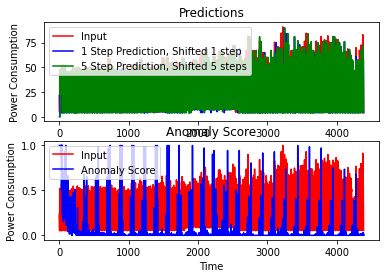

In [12]:
plt.subplot(2,1,1)
plt.title("Predictions")
plt.xlabel("Time")
plt.ylabel("Power Consumption")
plt.plot(np.arange(len(inputs)), inputs, 'red',
         np.arange(len(inputs)), predictions[1], 'blue',
         np.arange(len(inputs)), predictions[5], 'green',)
plt.legend(labels=('Input', '1 Step Prediction, Shifted 1 step', '5 Step Prediction, Shifted 5 steps'))

plt.subplot(2,1,2)
plt.title("Anomaly Score")
plt.xlabel("Time")
plt.ylabel("Power Consumption")
inputs = np.array(inputs) / max(inputs)
plt.plot(np.arange(len(inputs)), inputs, 'red',
         np.arange(len(inputs)), anomaly, 'blue',)
plt.legend(labels=('Input', 'Anomaly Score'))
plt.show()